# InstantID for ID-preserving generation with a single image

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/paulinamoskwa/notebooks/blob/main/notebooks/instantID.ipynb)
[![Kaggle](https://kaggle.com/static/images/open-in-kaggle.svg)](https://kaggle.com/kernels/welcome?src=https://github.com/paulinamoskwa/notebooks/blob/main/notebooks/instantID.ipynb)
[![GitHub](https://img.shields.io/badge/GitHub-black?logo=github)](https://github.com/InstantID/InstantID)
[![HuggingFace](https://img.shields.io/badge/%F0%9F%A4%97_Hugging_Face-grey)](https://huggingface.co/InstantX/InstantID)
[![arXiv](https://img.shields.io/badge/arXiv-2401.07519-b31b1b.svg)](https://arxiv.org/abs/2401.07519)

<span style="color:grey">
<div style="margin-left: 50px;">

<i>

<b>In this notebook</b>:

0. Setup
1. Model
2. Prompts
3. Input
4. Inference
5. Multiple images inference

</i>

</div>
</span>

## **0.** Setup

In [ ]:
!pip install insightface==0.7.3 onnxruntime
!pip install opencv-python transformers accelerate diffusers

In [2]:
# Download `pipeline_stable_diffusion_xl_instantid.py`
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/community/pipeline_stable_diffusion_xl_instantid.py

--2024-01-27 20:28:58--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/community/pipeline_stable_diffusion_xl_instantid.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 49168 (48K) [text/plain]
Saving to: ‘pipeline_stable_diffusion_xl_instantid.py.1’

pipeline_stable_dif 100%[===================>]  48.02K  --.-KB/s    in 0.006s  

2024-01-27 20:28:58 (7.44 MB/s) - ‘pipeline_stable_diffusion_xl_instantid.py.1’ saved [49168/49168]



In [3]:
# Download (and unzip) antelopev2 model
!mkdir -p /content/models
!wget https://github.com/paulinamoskwa/utils/raw/master/models/antelopev2.zip -P /content/models
!unzip /content/models/antelopev2.zip -d /content/models
!rm /content/models/antelopev2.zip

--2024-01-27 20:28:58--  https://github.com/paulinamoskwa/utils/raw/master/models/antelopev2.zip
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/paulinamoskwa/utils/master/models/antelopev2.zip [following]
--2024-01-27 20:28:59--  https://media.githubusercontent.com/media/paulinamoskwa/utils/master/models/antelopev2.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 360662982 (344M) [application/zip]
Saving to: ‘/content/models/antelopev2.zip’

antelopev2.zip      100%[===================>] 343.95M   108MB/s    in 3.2s    

2024-01-27 20:29:09 (108 MB/s) - ‘/content/models/antel

In [4]:
from huggingface_hub import hf_hub_download

# Download model checkpoints
hf_hub_download(repo_id="InstantX/InstantID", filename="ControlNetModel/config.json", local_dir="./checkpoints")
hf_hub_download(repo_id="InstantX/InstantID", filename="ControlNetModel/diffusion_pytorch_model.safetensors", local_dir="./checkpoints")
hf_hub_download(repo_id="InstantX/InstantID", filename="ip-adapter.bin", local_dir="./checkpoints")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


'./checkpoints/ip-adapter.bin'

In [5]:
import diffusers
from diffusers.utils import load_image
from diffusers.models import ControlNetModel

import cv2
import torch
import numpy as np
from PIL import Image

from insightface.app import FaceAnalysis
from pipeline_stable_diffusion_xl_instantid import StableDiffusionXLInstantIDPipeline, draw_kps

## **1.** Model

In [6]:
# Load antelopev2
app = FaceAnalysis(name='antelopev2', root='./', providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

# Load IdentityNet
controlnet_path = f'./checkpoints/ControlNetModel'
controlnet = ControlNetModel.from_pretrained(controlnet_path, torch_dtype = torch.float16)

# Base model alternatives:
# > "wangqixun/YamerMIX_v8" (https://civitai.com/models/84040?modelVersionId=196039)
# > "stabilityai/stable-diffusion-xl-base-1.0"
pipe = StableDiffusionXLInstantIDPipeline.from_pretrained(
    "wangqixun/YamerMIX_v8",
    controlnet = controlnet,
    torch_dtype = torch.float16,
)
pipe.cuda()

# Load adapter
face_adapter = f'./checkpoints/ip-adapter.bin'
pipe.load_ip_adapter_instantid(face_adapter)

/usr/local/lib/python3.10/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/antelopev2/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/antelopev2/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/antelopev2/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/antelopev2/glintr100.onnx recognition ['None', 3, 112, 112] 127.5 127.5
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/antelopev2/scrfd_10g_bnkps.onnx detection [1, 3, '?', '?'] 127.5 128.0
set det-size: (640, 640)


The config attributes {'controlnet_list': ['controlnet', 'RPMultiControlNetModel'], 'requires_aesthetics_score': False} were passed to StableDiffusionXLInstantIDPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'controlnet_list': ['controlnet', 'RPMultiControlNetModel'], 'requires_aesthetics_score': False} are not expected by StableDiffusionXLInstantIDPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## **2.** Prompts

In [7]:
style_list = [
    {
        "name": "watercolor",
        "prompt": "watercolor painting, {prompt}. vibrant, beautiful, painterly, detailed, textural, artistic",
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, anime, photorealistic, 35mm film, deformed, glitch, low contrast, noisy",
    },
    {
        "name": "film-noir",
        "prompt": "film noir style, ink sketch|vector, {prompt} highly detailed, sharp focus, ultra sharpness, monochrome, high contrast, dramatic shadows, 1940s style, mysterious, cinematic",
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, (frame:1.2), deformed, ugly, deformed eyes, blur, out of focus, blurry, deformed cat, deformed, photo, anthropomorphic cat, monochrome, photo, pet collar, gun, weapon, blue, 3d, drones, drone, buildings in background, green",
    },
    {
        "name": "neon",
        "prompt": "masterpiece painting, buildings in the backdrop, kaleidoscope, lilac orange blue cream fuchsia bright vivid gradient colors, the scene is cinematic, {prompt}, emotional realism, double exposure, watercolor ink pencil, graded wash, color layering, magic realism, figurative painting, intricate motifs, organic tracery, polished",
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, (frame:1.2), deformed, ugly, deformed eyes, blur, out of focus, blurry, deformed cat, deformed, photo, anthropomorphic cat, monochrome, photo, pet collar, gun, weapon, blue, 3d, drones, drone, buildings in background, green",
    },
    {
        "name": "jungle",
        "prompt": 'waist-up "{prompt} in a Jungle" by Syd Mead, tangerine cold color palette, muted colors, detailed, 8k,photo r3al,dripping paint,3d toon style,3d style,Movie Still',
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, (frame:1.2), deformed, ugly, deformed eyes, blur, out of focus, blurry, deformed cat, deformed, photo, anthropomorphic cat, monochrome, photo, pet collar, gun, weapon, blue, 3d, drones, drone, buildings in background, green",
    },
    {
        "name": "mars",
        "prompt": "{prompt}, Post-apocalyptic. Mars Colony, Scavengers roam the wastelands searching for valuable resources, rovers, bright morning sunlight shining, (detailed) (intricate) (8k) (HDR) (cinematic lighting) (sharp focus)",
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, (frame:1.2), deformed, ugly, deformed eyes, blur, out of focus, blurry, deformed cat, deformed, photo, anthropomorphic cat, monochrome, photo, pet collar, gun, weapon, blue, 3d, drones, drone, buildings in background, green",
    },
    {
        "name": "vibrant-color",
        "prompt": "vibrant colorful, ink sketch|vector|2d colors, at nightfall, sharp focus, {prompt}, highly detailed, sharp focus, the clouds,colorful,ultra sharpness",
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, (frame:1.2), deformed, ugly, deformed eyes, blur, out of focus, blurry, deformed cat, deformed, photo, anthropomorphic cat, monochrome, photo, pet collar, gun, weapon, blue, 3d, drones, drone, buildings in background, green",
    },
    {
        "name": "snow",
        "prompt": "cinema 4d render, {prompt}, high contrast, vibrant and saturated, sico style, surrounded by magical glow,floating ice shards, snow crystals, cold, windy background, frozen natural landscape in background  cinematic atmosphere,highly detailed, sharp focus, intricate design, 3d, unreal engine, octane render, CG best quality, highres, photorealistic, dramatic lighting, artstation, concept art, cinematic, epic Steven Spielberg movie still, sharp focus, smoke, sparks, art by pascal blanche and greg rutkowski and repin, trending on artstation, hyperrealism painting, matte painting, 4k resolution",
        "negative_prompt": "(lowres, low quality, worst quality:1.2), (text:1.2), watermark, (frame:1.2), deformed, ugly, deformed eyes, blur, out of focus, blurry, deformed cat, deformed, photo, anthropomorphic cat, monochrome, photo, pet collar, gun, weapon, blue, 3d, drones, drone, buildings in background, green",
    },
    {
        "name": "line-art",
        "prompt": "line art drawing {prompt} . professional, sleek, modern, minimalist, graphic, line art, vector graphics",
        "negative_prompt": "anime, photorealistic, 35mm film, deformed, glitch, blurry, noisy, off-center, deformed, cross-eyed, closed eyes, bad anatomy, ugly, disfigured, mutated, realism, realistic, impressionism, expressionism, oil, acrylic",
    },
]

In [8]:
style_names = ["watercolor", "film-noir", "neon", "jungle", "mars", "vibrant-color", "snow", "line-art"]

In [9]:
def get_prompt(name):
    for elem in style_list:
        if elem['name'] == name:
            return elem['prompt']

def get_negative_prompt(name):
    for elem in style_list:
        if elem['name'] == name:
            return elem['negative_prompt']

## **3.** Input

In [10]:
def get_face_info(face_image):
    face_info = app.get(cv2.cvtColor(np.array(face_image), cv2.COLOR_RGB2BGR))
    face_info = sorted(face_info, key=lambda x:(x['bbox'][2]-x['bbox'][0])*x['bbox'][3]-x['bbox'][1])[-1]  # only use the maximum face
    return face_info

def get_face_emb(face_info):
    face_emb = face_info['embedding']
    return face_emb

def get_face_kps(face_image, face_info):
    face_kps = draw_kps(face_image, face_info['kps'])
    return face_kps

In [11]:
def generate_id_image(
    prompt: str,
    negative_prompt: str,
    face_image,
    num_steps = 100,                    # [20, 100]
    guidance_scale = 5.6,               # [0.1, 10]
    adapter_strength_ratio = 1.5,       # [0, 1.5] (details level)
    identitynet_strength_ratio = 0.55,  # [0, 1.5] (fidelity to orignal image)
    width = 800,
    height = 1000,
    seed = 1971051673):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    generator = torch.Generator(device=device).manual_seed(seed)

    face_info = get_face_info(face_image)
    face_emb = get_face_emb(face_info)
    face_kps = get_face_kps(face_image, face_info)

    pipe.set_ip_adapter_scale(adapter_strength_ratio)
    images = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image_embeds=face_emb,
        image=face_kps,
        controlnet_conditioning_scale=float(identitynet_strength_ratio),
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale,
        height=height,
        width=width,
        generator=generator
    ).images

    return images[0]

## **4.** Inference

In [12]:
# Download an image as example
!wget https://www.voguehk.com/media/2022/08/333896203_213371374546590_5115771897579233344_n.jpeg

--2024-01-27 20:37:51--  https://www.voguehk.com/media/2022/08/333896203_213371374546590_5115771897579233344_n.jpeg
Resolving www.voguehk.com (www.voguehk.com)... 104.26.14.137, 172.67.74.2, 104.26.15.137, ...
Connecting to www.voguehk.com (www.voguehk.com)|104.26.14.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 82734 (81K) [image/jpeg]
Saving to: ‘333896203_213371374546590_5115771897579233344_n.jpeg.1’

333896203_213371374 100%[===================>]  80.79K  --.-KB/s    in 0.007s  

2024-01-27 20:37:53 (11.2 MB/s) - ‘333896203_213371374546590_5115771897579233344_n.jpeg.1’ saved [82734/82734]



In [13]:
# Load the image
face_image = load_image("333896203_213371374546590_5115771897579233344_n.jpeg")

/usr/local/lib/python3.10/dist-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


  0%|          | 0/100 [00:00<?, ?it/s]

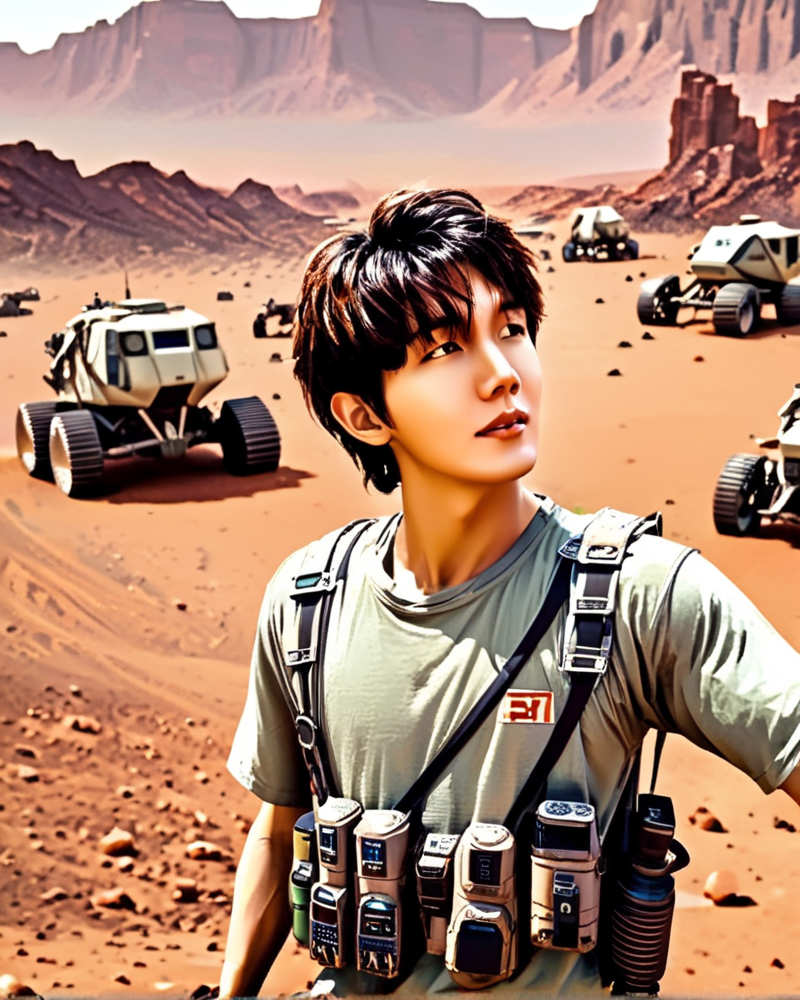

In [14]:
# Generate an image
generate_id_image(
    prompt = get_prompt("mars"),
    negative_prompt = get_negative_prompt("mars"),
    face_image = face_image
)

  0%|          | 0/100 [00:00<?, ?it/s]

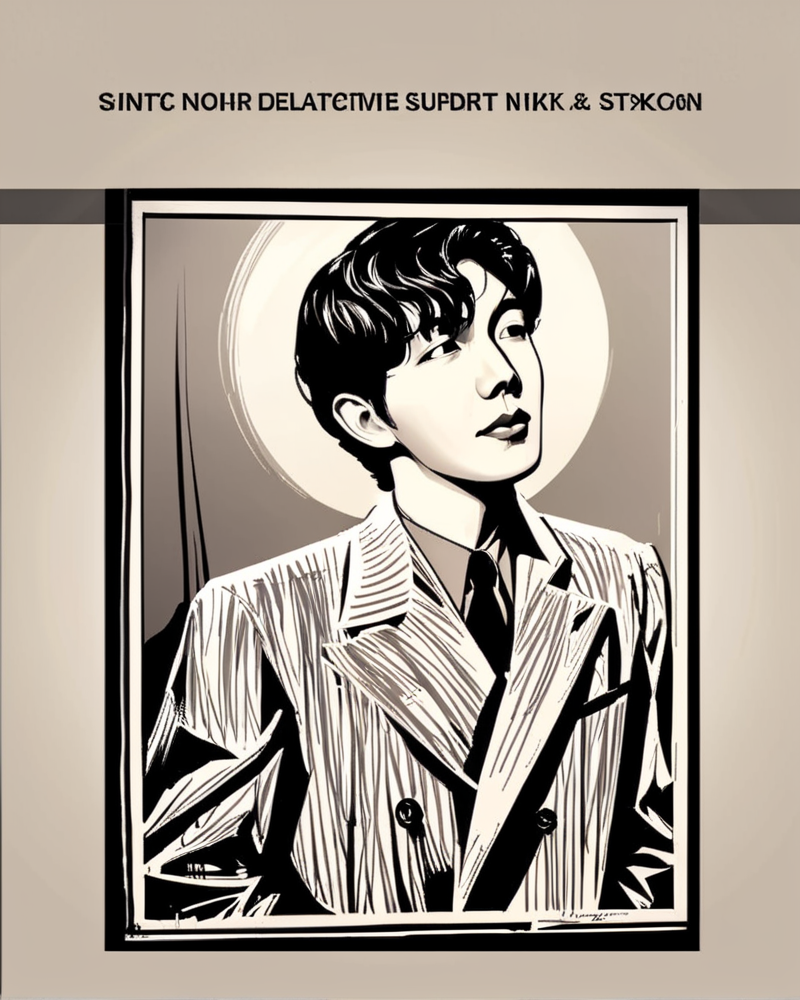

In [15]:
generate_id_image(
    prompt = get_prompt("film-noir"),
    negative_prompt = get_negative_prompt("film-noir"),
    face_image = face_image
)

  0%|          | 0/100 [00:00<?, ?it/s]

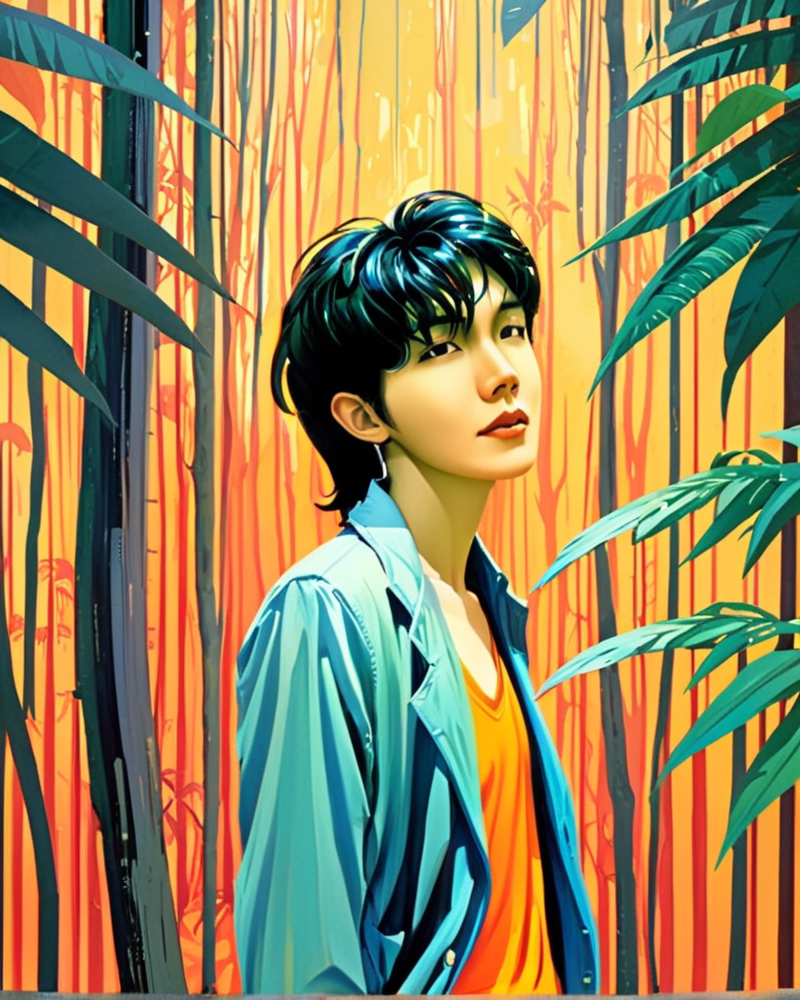

In [16]:
generate_id_image(
    prompt = get_prompt("jungle"),
    negative_prompt = get_negative_prompt("jungle"),
    face_image = face_image
)

## **5.** Multiple images inference

In [17]:
def generate_multiple_images(list_prompts, list_negative_prompts, face_image):
    assert len(list_prompts) == len(list_negative_prompts)
    images_list = []
    for prompt, negative_prompt in zip(list_prompts, list_negative_prompts):
        images_list.append(
            generate_id_image(
                prompt = prompt,
                negative_prompt = negative_prompt,
                face_image = face_image
            )
        )
    return images_list

In [18]:
def visualize_multiple_images(images_list):
    # For laziness in this notebook we only display even numbers of images :)
    assert len(images_list) % 2 == 0

    if len(images_list) > 4:
        num_cols = len(images_list) // 2
        num_rows = 2
    else:
        num_cols = len(images_list)
        num_rows = 1

    # Create grid
    image_width, image_height = images_list[0].size
    grid_width = num_cols * image_width
    grid_height = num_rows * image_height
    grid_image = Image.new('RGB', (grid_width, grid_height), color='white')
    for row in range(num_rows):
        for col in range(num_cols):
            index = row * num_cols + col
            if index < len(images_list):
                grid_image.paste(images_list[index], (col * image_width, row * image_height))

    return grid_image

In [19]:
prompts = []
negative_prompts = []

for style in style_list:
    prompts.append(style['prompt'])
    negative_prompts.append(style['negative_prompt'])

In [20]:
list_of_generated_images = generate_multiple_images(prompts, negative_prompts, face_image)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (127 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['lighting, artstation, concept art, cinematic, epic steven spielberg movie still, sharp focus, smoke, sparks, art by pascal blanche and greg rutkowski and repin, trending on artstation, hyperrealism painting, matte painting, 4 k resolution']
Token indices sequence length is longer than the specified maximum sequence length for this model (127 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['lighting, artstation, concept art, cinematic, epic steven spielberg movie still, sharp focus, smoke, sparks, art by pascal blanche and greg rutkowski and repin, trending on artstation, hy

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

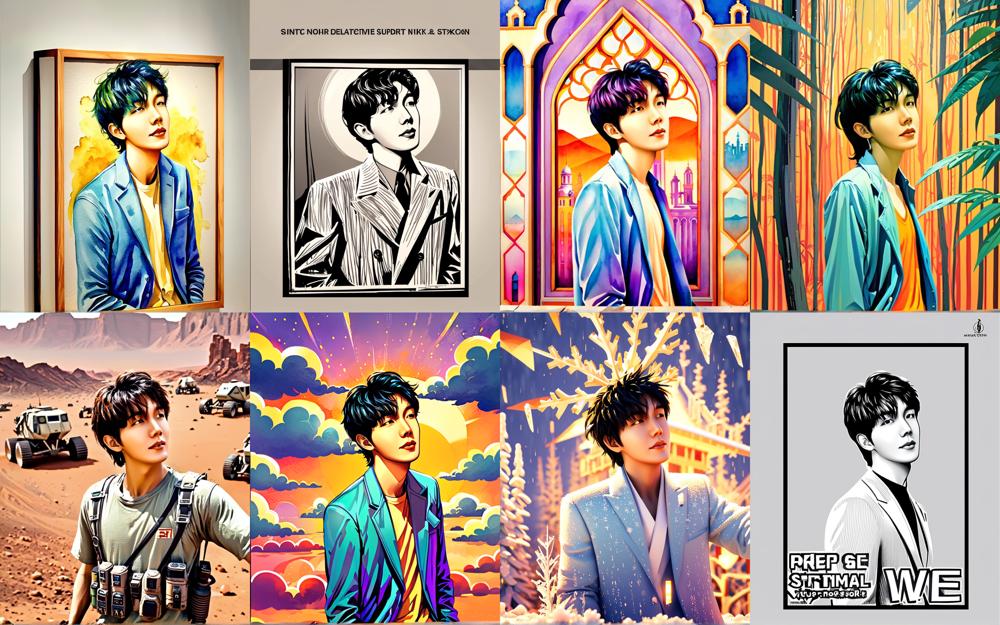

In [21]:
visualize_multiple_images(list_of_generated_images)